In [1]:
from IPython.core.display import display, HTML
display(HTML('<style>.container { width: 98% !important }</style>'))

In [2]:
from utilities import *

In [3]:
import joblib
import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import normalize
import seaborn as sns

sns.set()

In [4]:
ble = read_ble('../Data/ble.csv')

In [5]:
rssi = pd.read_csv('../Data/sequenceRssi5.csv')

In [6]:
rssi = rssi.pivot_table(columns="scanner", values="rssi", index="time")
rssi.rename_axis(None, axis=1, inplace=True)
rssi.index = pd.to_datetime(rssi.index)

In [7]:
rssi = rssi.groupby(pd.Grouper(freq='100ms')).mean()
rssi

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C
time,,,,,,,,,,,,,,,,,
2020-01-15 02:34:24.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-77.0,NaN,NaN,NaN,NaN
2020-01-15 02:34:24.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-15 02:34:24.200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-15 02:34:24.300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-83.0,NaN,NaN
2020-01-15 02:34:24.400,NaN,NaN,NaN,NaN,NaN,NaN,-73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-85.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-15 02:48:21.400,NaN,NaN,-78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-15 02:48:21.500,-87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-15 02:48:21.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-75.0,NaN,NaN,NaN,NaN,NaN,-81.0,-77.0,NaN


In [8]:
loc = pd.read_csv('../Data/sequenceLoc5.csv')
loc['time'] = pd.to_datetime(loc['time'])
loc.set_index('time', inplace=True)

In [9]:
loc.shape

(6841, 3)

In [10]:
loc = loc.groupby(pd.Grouper(freq='100ms')).mean()
loc

,X,Y
time,,
2020-01-15 02:34:19.600,0.944354,3.819803
2020-01-15 02:34:19.700,NaN,NaN
2020-01-15 02:34:19.800,0.940879,3.804735
2020-01-15 02:34:19.900,0.916146,3.815997
2020-01-15 02:34:20.000,0.912502,3.797356
...,...,...
2020-01-15 02:48:25.300,0.831394,2.889721
2020-01-15 02:48:25.400,0.837551,2.893820
2020-01-15 02:48:25.500,0.840014,2.892874


In [11]:
loc.isna().sum()

X    1946
Y    1946
dtype: int64

In [12]:
def transform(loc, inplace=False):
    if inplace:
        loc['X'] = 24.187023 + loc['X']
        loc['Y'] = 12.252072 - loc['Y']
    else:
        transformed = pd.DataFrame()
        transformed['X'] = 24.187023 + loc['X']
        transformed['Y'] = 12.252072 - loc['Y']
        return transformed
    
def scale(loc, inplace=False):
    if inplace:
        loc['X'] = loc['X'] / 33.5
        loc['Y'] = loc['Y'] / 16.8
    else:
        scaled = pd.DataFrame()
        scaled['X'] = loc['X'] / 33.5
        scaled['Y'] = loc['Y'] / 16.8
        return scaled
    
def inv_scale(loc, inplace=False):
    if inplace:
        loc['X'] = loc['X'] * 33.5
        loc['Y'] = loc['Y'] * 16.8
    else:
        scaled = pd.DataFrame()
        scaled['X'] = loc['X'] * 33.5
        scaled['Y'] = loc['Y'] * 16.8
        return scaled

In [13]:
transform(loc, inplace=True)
loc

,X,Y
time,,
2020-01-15 02:34:19.600,25.131377,8.432270
2020-01-15 02:34:19.700,NaN,NaN
2020-01-15 02:34:19.800,25.127902,8.447337
2020-01-15 02:34:19.900,25.103169,8.436075
2020-01-15 02:34:20.000,25.099525,8.454716
...,...,...
2020-01-15 02:48:25.300,25.018417,9.362351
2020-01-15 02:48:25.400,25.024574,9.358252
2020-01-15 02:48:25.500,25.027037,9.359198


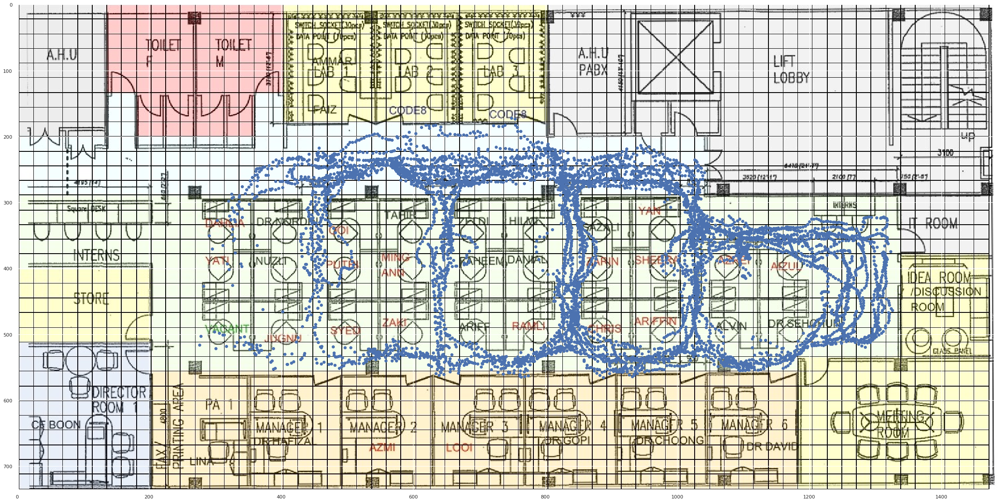

In [14]:
img =  mpimg.imread('../Map/main.png')

ori_loc = loc
plt.figure(figsize=(40,40))
plt.imshow(img)
plt.scatter(ori_loc['X'] * 44, ori_loc['Y'] * 44)
plt.show()

In [15]:
data = rssi.join(loc, how='inner')
data.shape

(8379, 19)

In [16]:
data.isna().sum()

C400A2E19293    7652
CD4533FFC0E1    7571
D2B6503554D7    7718
DB8B36A69C56    7495
DD697EA75B68    7714
DF231643E227    7403
E13B805C6CB0    7444
E43355CA8B96    7755
E6D9D20DD197    7113
E8FD0B453DC4    7888
E96AF2C858BA    7234
EC72840D9AD3    7434
F1307ECB3B90    7431
F1EDAF28E08A    7508
F69A86823B96    7536
FB2EE01C18CE    7735
FDAE5980F28C    7721
X               1943
Y               1943
dtype: int64

In [17]:
data.dropna(subset=['X', 'Y'], inplace=True)

In [18]:
data.describe()

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C,X,Y
count,501.000000,652.000000,524.000000,664.000000,533.000000,842.000000,787.000000,409.000000,1091.000000,322.000000,1020.000000,745.000000,775.000000,518.000000,679.000000,565.000000,460.000000,6436.000000,6436.000000
mean,-75.279774,-72.612730,-75.186546,-74.513805,-72.538462,-71.166667,-73.377171,-78.773839,-77.970593,-84.164596,-75.410131,-71.412528,-69.224946,-84.993243,-75.019661,-82.888791,-78.194928,19.665403,8.543887
std,8.706145,7.976815,8.367215,8.694922,7.519331,8.138686,7.714345,8.844563,9.587510,7.336436,9.671383,7.672381,7.990174,6.766786,7.890478,7.309309,7.878291,5.722913,2.480525
min,-96.000000,-96.000000,-98.000000,-94.000000,-97.000000,-98.000000,-94.000000,-98.000000,-97.000000,-98.000000,-98.000000,-94.000000,-94.000000,-98.000000,-97.000000,-96.000000,-98.000000,6.285700,3.915325
25%,-82.000000,-78.000000,-81.000000,-82.000000,-78.000000,-76.000000,-79.000000,-86.000000,-86.000000,-89.000000,-83.000000,-76.000000,-74.000000,-90.000000,-80.500000,-89.000000,-84.000000,14.828131,6.109795
50%,-75.000000,-72.000000,-75.000000,-74.000000,-72.000000,-70.000000,-73.000000,-80.000000,-79.000000,-84.000000,-75.500000,-71.500000,-69.000000,-86.000000,-75.000000,-84.000000,-77.000000,19.394482,8.145861
75%,-69.000000,-67.000000,-70.000000,-68.000000,-67.000000,-66.000000,-68.000000,-72.000000,-70.000000,-80.000000,-68.000000,-66.000000,-64.000000,-80.000000,-70.000000,-77.000000,-72.000000,23.703531,11.104953
max,-48.000000,-52.000000,-53.000000,-51.000000,-52.000000,-48.000000,-53.000000,-55.000000,-51.000000,-64.000000,-49.000000,-51.000000,-48.000000,-58.000000,-51.000000,-64.000000,-55.000000,30.135649,12.843796


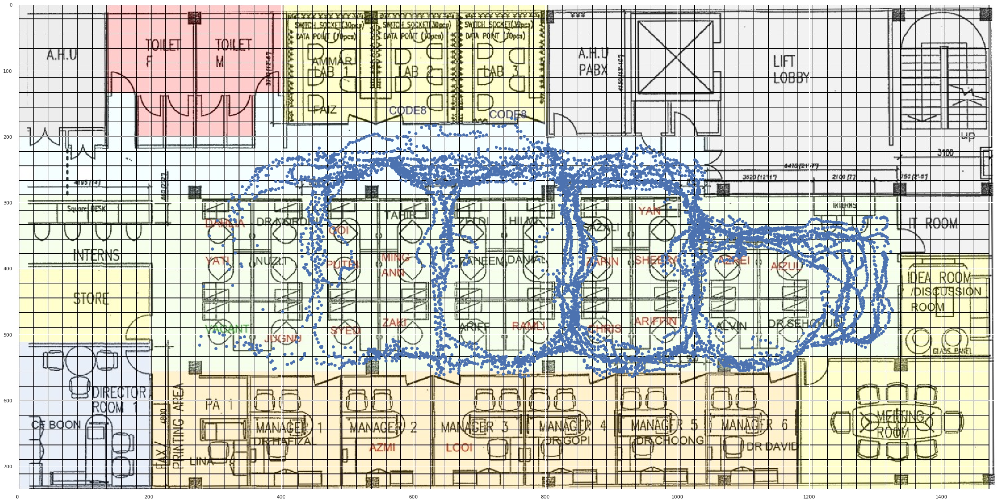

In [19]:
img =  mpimg.imread('../Map/main.png')

ori_data_loc = data[['X', 'Y']]
plt.figure(figsize=(40,40))
plt.imshow(img)
plt.scatter(ori_data_loc['X'] * 44, ori_data_loc['Y'] * 44)
plt.show()

In [20]:
test_rssi = pd.read_csv('../Data/testSequenceRssi.csv')

In [21]:
test_rssi = test_rssi.pivot_table(columns="scanner", values="rssi", index="time")
test_rssi.rename_axis(None, axis=1, inplace=True)
test_rssi.index = pd.to_datetime(test_rssi.index)

In [22]:
test_rssi = test_rssi.groupby(pd.Grouper(freq='100ms')).mean()
test_rssi

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C
time,,,,,,,,,,,,,,,,,
2020-01-16 06:05:55.500,NaN,-72.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-80.0,NaN,NaN,NaN,NaN,NaN
2020-01-16 06:05:55.600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-82.0,NaN
2020-01-16 06:05:55.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-70.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-16 06:05:55.800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-16 06:05:55.900,NaN,NaN,NaN,NaN,NaN,-66.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-16 06:09:09.900,NaN,NaN,NaN,NaN,NaN,NaN,-81.0,NaN,-76.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-16 06:09:10.000,NaN,NaN,NaN,NaN,NaN,-65.5,NaN,NaN,-88.0,NaN,NaN,NaN,-86.0,NaN,NaN,NaN,NaN
2020-01-16 06:09:10.100,NaN,NaN,NaN,NaN,-84.0,NaN,NaN,NaN,-75.0,NaN,NaN,NaN,NaN,NaN,NaN,-91.0,NaN


In [23]:
test_loc = pd.read_csv('../Data/testSequenceLoc.csv')
test_loc['time'] = pd.to_datetime(test_loc['time'])
test_loc.set_index('time', inplace=True)

In [24]:
test_loc.shape

(1586, 3)

In [25]:
test_loc = test_loc.groupby(pd.Grouper(freq='100ms')).mean()
test_loc

,X,Y
time,,
2020-01-16 06:05:51.600,0.638201,3.737365
2020-01-16 06:05:51.700,0.627788,3.743914
2020-01-16 06:05:51.800,0.608325,3.781897
2020-01-16 06:05:51.900,NaN,NaN
2020-01-16 06:05:52.000,0.604214,3.792129
...,...,...
2020-01-16 06:09:12.200,NaN,NaN
2020-01-16 06:09:12.300,1.054581,2.695702
2020-01-16 06:09:12.400,1.019592,2.714561


In [26]:
test_loc.isna().sum()

X    995
Y    995
dtype: int64

In [27]:
transform(test_loc, inplace=True)
test_loc

,X,Y
time,,
2020-01-16 06:05:51.600,24.825224,8.514707
2020-01-16 06:05:51.700,24.814811,8.508158
2020-01-16 06:05:51.800,24.795348,8.470175
2020-01-16 06:05:51.900,NaN,NaN
2020-01-16 06:05:52.000,24.791237,8.459943
...,...,...
2020-01-16 06:09:12.200,NaN,NaN
2020-01-16 06:09:12.300,25.241604,9.556370
2020-01-16 06:09:12.400,25.206615,9.537511


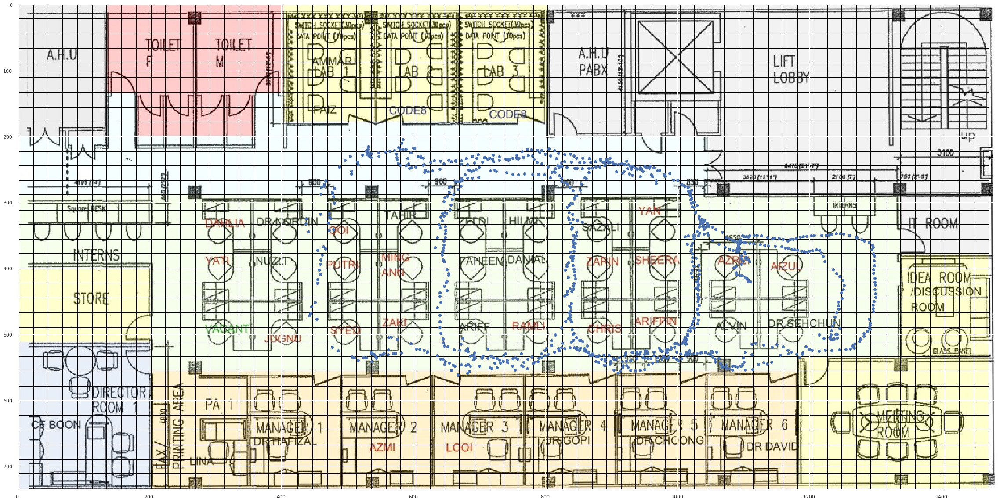

In [28]:
img =  mpimg.imread('../Map/main.png')

ori_loc = test_loc
plt.figure(figsize=(40,40))
plt.imshow(img)
plt.scatter(ori_loc['X'] * 44, ori_loc['Y'] * 44)
plt.show()

In [29]:
test = test_rssi.join(test_loc, how='inner')
test.shape

(1949, 19)

In [30]:
test.isna().sum()

C400A2E19293    1778
CD4533FFC0E1    1736
D2B6503554D7    1762
DB8B36A69C56    1753
DD697EA75B68    1714
DF231643E227    1609
E13B805C6CB0    1573
E43355CA8B96    1783
E6D9D20DD197    1495
E8FD0B453DC4    1838
E96AF2C858BA    1571
EC72840D9AD3    1727
F1307ECB3B90    1667
F1EDAF28E08A    1732
F69A86823B96    1762
FB2EE01C18CE    1627
FDAE5980F28C    1799
X                972
Y                972
dtype: int64

In [31]:
test.dropna(subset=['X', 'Y'], inplace=True)

In [32]:
test.describe()

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C,X,Y
count,72.000000,115.000000,83.000000,102.000000,102.000000,180.000000,190.000000,76.000000,249.000000,49.000000,194.000000,119.000000,130.000000,96.000000,98.000000,167.000000,55.000000,977.000000,977.000000
mean,-74.472222,-71.279710,-72.012048,-74.019608,-71.311275,-69.986111,-71.363158,-79.967105,-77.291165,-83.693878,-73.426117,-71.079832,-68.107692,-85.692708,-74.462075,-81.516467,-76.436364,20.181794,9.017888
std,8.906750,7.318684,8.081134,7.610546,7.765231,7.965083,8.340931,8.666539,8.597787,7.433606,8.362693,7.958575,8.095837,5.910014,6.329657,7.259504,9.091640,4.953950,2.639662
min,-91.000000,-94.000000,-91.000000,-91.000000,-93.000000,-90.000000,-96.000000,-94.000000,-97.000000,-97.000000,-96.000000,-92.000000,-95.000000,-96.000000,-96.000000,-97.000000,-92.000000,9.946365,4.659720
25%,-81.250000,-75.000000,-77.000000,-80.000000,-76.000000,-75.000000,-77.000000,-87.000000,-84.000000,-89.000000,-79.000000,-76.500000,-73.000000,-90.250000,-78.875000,-87.000000,-85.000000,16.112501,6.323763
50%,-74.500000,-71.000000,-72.000000,-74.500000,-71.000000,-69.000000,-71.000000,-81.250000,-77.000000,-85.000000,-73.750000,-72.000000,-67.000000,-85.000000,-75.000000,-81.500000,-75.000000,20.033921,8.706482
75%,-68.000000,-67.000000,-67.000000,-69.000000,-65.250000,-65.000000,-66.000000,-73.750000,-71.000000,-77.000000,-68.000000,-66.000000,-63.000000,-82.000000,-70.000000,-76.000000,-69.000000,23.600515,11.885069
max,-51.000000,-54.000000,-55.000000,-58.000000,-51.000000,-48.000000,-51.000000,-59.000000,-52.000000,-67.000000,-51.000000,-51.000000,-53.000000,-71.000000,-59.000000,-63.000000,-53.000000,29.547332,12.750413


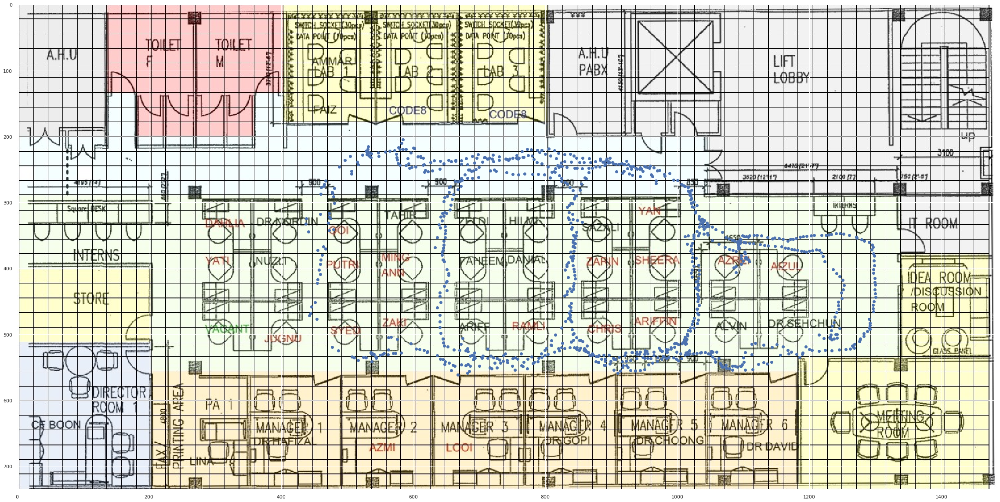

In [33]:
img =  mpimg.imread('../Map/main.png')

ori_data_loc = test[['X', 'Y']]
plt.figure(figsize=(40,40))
plt.imshow(img)
plt.scatter(ori_data_loc['X'] * 44, ori_data_loc['Y'] * 44)
plt.show()

In [34]:
def impute(data):
    data.update(data.rolling('5s').mean())
    data.ffill(inplace=True)

In [35]:
def reg_impute(data):
    for s in scanners:
        dx = data['X'] - ble[s]['X']
        dy = data['Y'] - ble[s]['Y']
        d = np.sqrt(np.square(dy) + np.square(dx))
        reg = joblib.load('../Models/linear_distance_models_2/{}.joblib'.format(s))
        ss = pd.Series(reg.predict(d.values.reshape((-1, 1))))
        ss.index = data.index
        data[s].fillna(ss, inplace=True)

In [36]:
impute(data)
reg_impute(data)
data[scanners] = normalize(data[scanners] + 100)

In [37]:
data.describe()

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C,X,Y
count,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000,6436.000000
mean,0.223130,0.270814,0.239353,0.244430,0.268216,0.285813,0.262023,0.189535,0.191918,0.143613,0.224065,0.284289,0.298090,0.121934,0.249047,0.161318,0.196080,19.575174,8.622924
std,0.073874,0.061318,0.063152,0.067723,0.055010,0.083321,0.070374,0.068998,0.094925,0.060955,0.101453,0.055275,0.055634,0.053889,0.060373,0.072808,0.066668,5.775467,2.372934
min,0.049564,0.070970,0.019244,0.071086,0.110902,0.018787,0.097198,0.058070,0.042161,0.022490,0.041036,0.121687,0.106901,0.020806,0.110974,0.039841,0.033046,6.376493,4.381876
25%,0.171214,0.228851,0.199059,0.192661,0.227995,0.217665,0.213586,0.140178,0.119438,0.103141,0.146581,0.247276,0.265905,0.084500,0.208317,0.106928,0.146974,14.887623,6.277851
50%,0.220546,0.269408,0.234296,0.237443,0.270485,0.289435,0.263736,0.178234,0.169206,0.146365,0.196651,0.279386,0.300689,0.118187,0.242772,0.139272,0.197340,19.456859,8.291541
75%,0.278808,0.313524,0.272461,0.290405,0.307317,0.355960,0.309519,0.229750,0.244881,0.178010,0.291318,0.315511,0.337224,0.149556,0.279316,0.210149,0.243485,23.879264,11.021730
max,0.469667,0.456278,0.443904,0.426756,0.431314,0.492061,0.466671,0.468342,0.446412,0.381225,0.487887,0.490849,0.422843,0.398007,0.441291,0.381478,0.364643,29.884454,12.465724


In [38]:
impute(test)
reg_impute(test)
test[scanners] = normalize(test[scanners] + 100)

In [39]:
test.describe()

,C400A2E19293,CD4533FFC0E1,D2B6503554D7,DB8B36A69C56,DD697EA75B68,DF231643E227,E13B805C6CB0,E43355CA8B96,E6D9D20DD197,E8FD0B453DC4,E96AF2C858BA,EC72840D9AD3,F1307ECB3B90,F1EDAF28E08A,F69A86823B96,FB2EE01C18CE,FDAE5980F28C,X,Y
count,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000,977.000000
mean,0.223534,0.275840,0.263193,0.234891,0.276589,0.285312,0.265657,0.174568,0.200954,0.131707,0.233254,0.273959,0.289202,0.123337,0.254824,0.165052,0.214023,20.094697,9.061833
std,0.064937,0.044326,0.062664,0.052772,0.055639,0.074692,0.071329,0.059214,0.081371,0.053332,0.080007,0.053411,0.057117,0.045115,0.051143,0.070096,0.069884,4.841488,2.574833
min,0.092480,0.175161,0.126399,0.117873,0.075927,0.085251,0.056558,0.078951,0.068179,0.027007,0.108927,0.166524,0.049680,0.044824,0.138554,0.034040,0.099945,10.177990,5.182450
25%,0.177154,0.240133,0.209649,0.193745,0.247735,0.230187,0.209370,0.130380,0.130726,0.091442,0.172044,0.238888,0.265860,0.087726,0.216114,0.106786,0.147758,16.412370,6.408042
50%,0.219344,0.274262,0.261776,0.231513,0.272857,0.280138,0.271489,0.160548,0.192032,0.117303,0.221183,0.264694,0.290750,0.114606,0.250166,0.157373,0.213394,19.808744,8.942351
75%,0.265421,0.301045,0.300136,0.272139,0.315295,0.345298,0.313556,0.214483,0.253959,0.177145,0.270508,0.308286,0.330186,0.152848,0.290910,0.216112,0.269712,23.358793,11.895544
max,0.412678,0.396514,0.409437,0.374123,0.405665,0.440556,0.416300,0.336808,0.400136,0.284517,0.451133,0.437859,0.389883,0.251235,0.374335,0.324322,0.412741,29.407900,12.379448


In [40]:
def create_window(dataset, win_size, start_index=0, end_index=None):
    data = []
    labels = []

    start_index = start_index + win_size
    if end_index is None:
        end_index = len(dataset)

    for i in range(start_index, end_index):
        indices = range(i-win_size, i)
        data.append(dataset[scanners].iloc[indices].values)
        labels.append(dataset[['X', 'Y']].iloc[indices].values)
    return np.array(data), np.array(labels)

In [41]:
win_size = 10
X, y = create_window(data, win_size)

In [42]:
X_test, y_test = create_window(test, win_size)

In [43]:
msk = np.random.rand(len(X)) < 0.8
X_train, y_train = X[msk], y[msk]
X_validation, y_validation = X[~msk], y[~msk]

In [44]:
batch_size = 32
ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
ds = ds.batch(batch_size)

In [45]:
ds_validation = tf.data.Dataset.from_tensor_slices((X_validation, y_validation))
ds_validation = ds_validation.batch(batch_size)

In [46]:
ds_test = tf.data.Dataset.from_tensor_slices((X_test, y_test))
ds_test = ds_test.batch(batch_size)

In [47]:
epochs = 50000

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=100, monitor='val_mse')
]

metrics = ['mae', 'mse']

inputs = tf.keras.Input(shape=(win_size, 17))
lstm = tf.keras.layers.LSTM(128, activation='relu', return_sequences=True)(inputs)

x = tf.keras.layers.Dense(128, activation='relu')(lstm)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(32, activation='relu')(x)
x = tf.keras.layers.Dense(16, activation='relu')(x)
x = tf.keras.layers.Dense(1)(x)

y = tf.keras.layers.Dense(128, activation='relu')(lstm)
y = tf.keras.layers.Dense(64, activation='relu')(y)
y = tf.keras.layers.Dense(32, activation='relu')(y)
y = tf.keras.layers.Dense(16, activation='relu')(y)
y = tf.keras.layers.Dense(1)(y)

outputs = tf.keras.layers.Concatenate(axis=2)([x, y])

model = tf.keras.Model(inputs=inputs, outputs=outputs)

optimizer = tf.keras.optimizers.Adam(0.0001)
model.compile(optimizer=optimizer, loss='mse', metrics=metrics)

In [48]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 10, 17)]     0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 10, 128)      74752       input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 10, 128)      16512       lstm[0][0]                       
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 10, 128)      16512       lstm[0][0]                       
______________________________________________________________________________________________

In [49]:
history = model.fit(ds, epochs=epochs, validation_data=ds_validation, callbacks=callbacks)

Epoch 1/50000
160/160 [==============================] - 6s 35ms/step - loss: 209.2577 - mae: 12.6701 - mse: 209.4391 - val_loss: 0.0000e+00 - val_mae: 0.0000e+00 - val_mse: 0.0000e+00
Epoch 2/50000
160/160 [==============================] - 1s 9ms/step - loss: 94.3298 - mae: 7.6458 - mse: 94.3021 - val_loss: 63.8571 - val_mae: 6.0664 - val_mse: 63.7753
Epoch 3/50000
160/160 [==============================] - 1s 9ms/step - loss: 44.0775 - mae: 4.8411 - mse: 44.0580 - val_loss: 30.1501 - val_mae: 3.9252 - val_mse: 30.1286
Epoch 4/50000
160/160 [==============================] - 1s 9ms/step - loss: 25.7050 - mae: 3.6273 - mse: 25.6962 - val_loss: 20.2369 - val_mae: 3.1617 - val_mse: 20.2266
Epoch 5/50000
160/160 [==============================] - 1s 9ms/step - loss: 17.6207 - mae: 2.9895 - mse: 17.6111 - val_loss: 14.0915 - val_mae: 2.6356 - val_mse: 14.0929
Epoch 6/50000
160/160 [==============================] - 1s 9ms/step - loss: 12.8876 - mae: 2.5964 - mse: 12.8784 - val_loss: 10.76

160/160 [==============================] - 1s 8ms/step - loss: 2.2941 - mae: 1.2174 - mse: 2.2904 - val_loss: 2.0602 - val_mae: 1.1528 - val_mse: 2.0589
Epoch 50/50000
160/160 [==============================] - 1s 8ms/step - loss: 2.2726 - mae: 1.2106 - mse: 2.2689 - val_loss: 2.0424 - val_mae: 1.1470 - val_mse: 2.0415
Epoch 51/50000
160/160 [==============================] - 1s 8ms/step - loss: 2.2506 - mae: 1.2037 - mse: 2.2469 - val_loss: 2.0265 - val_mae: 1.1418 - val_mse: 2.0258
Epoch 52/50000
160/160 [==============================] - 1s 8ms/step - loss: 2.2298 - mae: 1.1969 - mse: 2.2261 - val_loss: 2.0107 - val_mae: 1.1365 - val_mse: 2.0103
Epoch 53/50000
160/160 [==============================] - 1s 8ms/step - loss: 2.2091 - mae: 1.1903 - mse: 2.2056 - val_loss: 1.9935 - val_mae: 1.1309 - val_mse: 1.9934
Epoch 54/50000
160/160 [==============================] - 1s 8ms/step - loss: 2.1894 - mae: 1.1841 - mse: 2.1858 - val_loss: 1.9776 - val_mae: 1.1257 - val_mse: 1.9777
Epoch 5

Epoch 98/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.6202 - mae: 1.0115 - mse: 1.6174 - val_loss: 1.4966 - val_mae: 0.9665 - val_mse: 1.5006
Epoch 99/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.6106 - mae: 1.0085 - mse: 1.6078 - val_loss: 1.4893 - val_mae: 0.9640 - val_mse: 1.4933
Epoch 100/50000
160/160 [==============================] - 1s 9ms/step - loss: 1.6012 - mae: 1.0056 - mse: 1.5983 - val_loss: 1.4821 - val_mae: 0.9614 - val_mse: 1.4861
Epoch 101/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.5917 - mae: 1.0026 - mse: 1.5888 - val_loss: 1.4749 - val_mae: 0.9589 - val_mse: 1.4790
Epoch 102/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.5824 - mae: 0.9997 - mse: 1.5796 - val_loss: 1.4678 - val_mae: 0.9564 - val_mse: 1.4719
Epoch 103/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.5735 - mae: 0.9969 - mse: 1.5706 - val_loss: 1.4613 - val_mae: 0.9540 - val_

160/160 [==============================] - 1s 9ms/step - loss: 1.2429 - mae: 0.8773 - mse: 1.2408 - val_loss: 1.2393 - val_mae: 0.8677 - val_mse: 1.2433
Epoch 147/50000
160/160 [==============================] - 1s 8ms/step - loss: 1.2368 - mae: 0.8749 - mse: 1.2348 - val_loss: 1.2350 - val_mae: 0.8659 - val_mse: 1.2390
Epoch 148/50000
160/160 [==============================] - 1s 9ms/step - loss: 1.2307 - mae: 0.8724 - mse: 1.2286 - val_loss: 1.2309 - val_mae: 0.8641 - val_mse: 1.2348
Epoch 149/50000
160/160 [==============================] - 1s 9ms/step - loss: 1.2245 - mae: 0.8699 - mse: 1.2225 - val_loss: 1.2264 - val_mae: 0.8623 - val_mse: 1.2303
Epoch 150/50000
160/160 [==============================] - 1s 9ms/step - loss: 1.2184 - mae: 0.8673 - mse: 1.2164 - val_loss: 1.2225 - val_mae: 0.8606 - val_mse: 1.2263
Epoch 151/50000
160/160 [==============================] - 1s 9ms/step - loss: 1.2124 - mae: 0.8648 - mse: 1.2104 - val_loss: 1.2185 - val_mae: 0.8589 - val_mse: 1.2223
Ep

160/160 [==============================] - 1s 9ms/step - loss: 1.0020 - mae: 0.7756 - mse: 1.0004 - val_loss: 1.0505 - val_mae: 0.7906 - val_mse: 1.0519
Epoch 195/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.9977 - mae: 0.7737 - mse: 0.9961 - val_loss: 1.0463 - val_mae: 0.7888 - val_mse: 1.0477
Epoch 196/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.9935 - mae: 0.7718 - mse: 0.9920 - val_loss: 1.0425 - val_mae: 0.7872 - val_mse: 1.0439
Epoch 197/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.9893 - mae: 0.7699 - mse: 0.9878 - val_loss: 1.0388 - val_mae: 0.7856 - val_mse: 1.0401
Epoch 198/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.9852 - mae: 0.7680 - mse: 0.9836 - val_loss: 1.0352 - val_mae: 0.7840 - val_mse: 1.0364
Epoch 199/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.9810 - mae: 0.7661 - mse: 0.9795 - val_loss: 1.0321 - val_mae: 0.7827 - val_mse: 1.0333
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.8325 - mae: 0.6992 - mse: 0.8312 - val_loss: 0.9053 - val_mae: 0.7298 - val_mse: 0.9057
Epoch 243/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.8296 - mae: 0.6979 - mse: 0.8282 - val_loss: 0.9032 - val_mae: 0.7290 - val_mse: 0.9036
Epoch 244/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.8267 - mae: 0.6965 - mse: 0.8253 - val_loss: 0.9008 - val_mae: 0.7280 - val_mse: 0.9012
Epoch 245/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.8239 - mae: 0.6952 - mse: 0.8225 - val_loss: 0.8988 - val_mae: 0.7272 - val_mse: 0.8992
Epoch 246/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.8210 - mae: 0.6939 - mse: 0.8197 - val_loss: 0.8969 - val_mae: 0.7264 - val_mse: 0.8973
Epoch 247/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.8183 - mae: 0.6927 - mse: 0.8170 - val_loss: 0.8944 - val_mae: 0.7254 - val_mse: 0.8949
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.7076 - mae: 0.6394 - mse: 0.7064 - val_loss: 0.8090 - val_mae: 0.6904 - val_mse: 0.8100
Epoch 291/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.7050 - mae: 0.6381 - mse: 0.7038 - val_loss: 0.8077 - val_mae: 0.6898 - val_mse: 0.8087
Epoch 292/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.7024 - mae: 0.6368 - mse: 0.7012 - val_loss: 0.8064 - val_mae: 0.6893 - val_mse: 0.8074
Epoch 293/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.7000 - mae: 0.6356 - mse: 0.6988 - val_loss: 0.8048 - val_mae: 0.6886 - val_mse: 0.8059
Epoch 294/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.6975 - mae: 0.6344 - mse: 0.6964 - val_loss: 0.8033 - val_mae: 0.6880 - val_mse: 0.8045
Epoch 295/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.6952 - mae: 0.6332 - mse: 0.6941 - val_loss: 0.8019 - val_mae: 0.6874 - val_mse: 0.8031
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.5967 - mae: 0.5816 - mse: 0.5957 - val_loss: 0.7489 - val_mae: 0.6664 - val_mse: 0.7515
Epoch 339/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.5945 - mae: 0.5803 - mse: 0.5935 - val_loss: 0.7478 - val_mae: 0.6659 - val_mse: 0.7504
Epoch 340/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.5923 - mae: 0.5791 - mse: 0.5913 - val_loss: 0.7477 - val_mae: 0.6660 - val_mse: 0.7503
Epoch 341/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.5902 - mae: 0.5779 - mse: 0.5892 - val_loss: 0.7469 - val_mae: 0.6657 - val_mse: 0.7496
Epoch 342/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.5881 - mae: 0.5767 - mse: 0.5871 - val_loss: 0.7464 - val_mae: 0.6656 - val_mse: 0.7491
Epoch 343/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.5859 - mae: 0.5755 - mse: 0.5850 - val_loss: 0.7458 - val_mae: 0.6654 - val_mse: 0.7486
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.4899 - mae: 0.5196 - mse: 0.4892 - val_loss: 0.6909 - val_mae: 0.6401 - val_mse: 0.6942
Epoch 387/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.4877 - mae: 0.5182 - mse: 0.4870 - val_loss: 0.6911 - val_mae: 0.6401 - val_mse: 0.6945
Epoch 388/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.4855 - mae: 0.5168 - mse: 0.4848 - val_loss: 0.6901 - val_mae: 0.6396 - val_mse: 0.6934
Epoch 389/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.4834 - mae: 0.5154 - mse: 0.4827 - val_loss: 0.6891 - val_mae: 0.6391 - val_mse: 0.6925
Epoch 390/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.4812 - mae: 0.5140 - mse: 0.4805 - val_loss: 0.6877 - val_mae: 0.6385 - val_mse: 0.6911
Epoch 391/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.4791 - mae: 0.5127 - mse: 0.4784 - val_loss: 0.6848 - val_mae: 0.6371 - val_mse: 0.6882
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.3959 - mae: 0.4584 - mse: 0.3954 - val_loss: 0.6312 - val_mae: 0.6135 - val_mse: 0.6344
Epoch 435/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3942 - mae: 0.4572 - mse: 0.3937 - val_loss: 0.6297 - val_mae: 0.6126 - val_mse: 0.6329
Epoch 436/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3922 - mae: 0.4559 - mse: 0.3917 - val_loss: 0.6331 - val_mae: 0.6143 - val_mse: 0.6364
Epoch 437/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3900 - mae: 0.4544 - mse: 0.3895 - val_loss: 0.6292 - val_mae: 0.6124 - val_mse: 0.6325
Epoch 438/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3891 - mae: 0.4538 - mse: 0.3886 - val_loss: 0.6314 - val_mae: 0.6133 - val_mse: 0.6347
Epoch 439/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3863 - mae: 0.4518 - mse: 0.3858 - val_loss: 0.6275 - val_mae: 0.6117 - val_mse: 0.6308
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.3617 - mae: 0.4419 - mse: 0.3619 - val_loss: 0.8803 - val_mae: 0.7132 - val_mse: 0.8881
Epoch 483/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3617 - mae: 0.4439 - mse: 0.3615 - val_loss: 0.6643 - val_mae: 0.6248 - val_mse: 0.6692
Epoch 484/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3629 - mae: 0.4433 - mse: 0.3624 - val_loss: 0.6617 - val_mae: 0.6363 - val_mse: 0.6657
Epoch 485/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3615 - mae: 0.4421 - mse: 0.3610 - val_loss: 0.5406 - val_mae: 0.5725 - val_mse: 0.5422
Epoch 486/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3749 - mae: 0.4503 - mse: 0.3743 - val_loss: 0.5502 - val_mae: 0.5761 - val_mse: 0.5531
Epoch 487/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3305 - mae: 0.4152 - mse: 0.3301 - val_loss: 0.5520 - val_mae: 0.5748 - val_mse: 0.5550
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.2955 - mae: 0.3897 - mse: 0.2952 - val_loss: 0.5665 - val_mae: 0.5816 - val_mse: 0.5702
Epoch 531/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3131 - mae: 0.4087 - mse: 0.3132 - val_loss: 0.7072 - val_mae: 0.6399 - val_mse: 0.7130
Epoch 532/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3329 - mae: 0.4253 - mse: 0.3329 - val_loss: 0.7681 - val_mae: 0.6615 - val_mse: 0.7749
Epoch 533/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2994 - mae: 0.3975 - mse: 0.2989 - val_loss: 0.5535 - val_mae: 0.5812 - val_mse: 0.5568
Epoch 534/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3054 - mae: 0.3988 - mse: 0.3051 - val_loss: 0.5053 - val_mae: 0.5565 - val_mse: 0.5069
Epoch 535/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.3058 - mae: 0.3994 - mse: 0.3055 - val_loss: 0.4667 - val_mae: 0.5310 - val_mse: 0.4680
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.3410 - mae: 0.4296 - mse: 0.3412 - val_loss: 0.4830 - val_mae: 0.5374 - val_mse: 0.4826
Epoch 579/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2863 - mae: 0.3858 - mse: 0.2861 - val_loss: 0.4094 - val_mae: 0.4847 - val_mse: 0.4094
Epoch 580/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2591 - mae: 0.3598 - mse: 0.2587 - val_loss: 0.3941 - val_mae: 0.4795 - val_mse: 0.3955
Epoch 581/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2412 - mae: 0.3437 - mse: 0.2408 - val_loss: 0.4377 - val_mae: 0.5118 - val_mse: 0.4401
Epoch 582/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2390 - mae: 0.3452 - mse: 0.2387 - val_loss: 0.4244 - val_mae: 0.5016 - val_mse: 0.4266
Epoch 583/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2371 - mae: 0.3403 - mse: 0.2368 - val_loss: 0.4656 - val_mae: 0.5283 - val_mse: 0.4685
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.2373 - mae: 0.3481 - mse: 0.2372 - val_loss: 0.4142 - val_mae: 0.4840 - val_mse: 0.4148
Epoch 627/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2710 - mae: 0.3722 - mse: 0.2707 - val_loss: 0.4194 - val_mae: 0.5017 - val_mse: 0.4217
Epoch 628/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2779 - mae: 0.3881 - mse: 0.2775 - val_loss: 0.3863 - val_mae: 0.4754 - val_mse: 0.3880
Epoch 629/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2265 - mae: 0.3348 - mse: 0.2264 - val_loss: 0.4434 - val_mae: 0.5129 - val_mse: 0.4464
Epoch 630/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2206 - mae: 0.3318 - mse: 0.2202 - val_loss: 0.3725 - val_mae: 0.4638 - val_mse: 0.3741
Epoch 631/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2178 - mae: 0.3235 - mse: 0.2176 - val_loss: 0.4302 - val_mae: 0.5049 - val_mse: 0.4329
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1932 - mae: 0.3055 - mse: 0.1930 - val_loss: 0.3403 - val_mae: 0.4391 - val_mse: 0.3418
Epoch 675/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1894 - mae: 0.2988 - mse: 0.1893 - val_loss: 0.3761 - val_mae: 0.4696 - val_mse: 0.3784
Epoch 676/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1920 - mae: 0.3028 - mse: 0.1918 - val_loss: 0.3735 - val_mae: 0.4684 - val_mse: 0.3756
Epoch 677/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1898 - mae: 0.2988 - mse: 0.1896 - val_loss: 0.3790 - val_mae: 0.4745 - val_mse: 0.3808
Epoch 678/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2081 - mae: 0.3185 - mse: 0.2080 - val_loss: 0.3891 - val_mae: 0.4807 - val_mse: 0.3905
Epoch 679/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2277 - mae: 0.3388 - mse: 0.2279 - val_loss: 0.3993 - val_mae: 0.4875 - val_mse: 0.3997
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.2192 - mae: 0.3337 - mse: 0.2192 - val_loss: 0.4539 - val_mae: 0.5296 - val_mse: 0.4574
Epoch 723/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2408 - mae: 0.3623 - mse: 0.2406 - val_loss: 0.3853 - val_mae: 0.4748 - val_mse: 0.3866
Epoch 724/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2191 - mae: 0.3325 - mse: 0.2188 - val_loss: 0.3444 - val_mae: 0.4529 - val_mse: 0.3462
Epoch 725/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1837 - mae: 0.3036 - mse: 0.1835 - val_loss: 0.2972 - val_mae: 0.4019 - val_mse: 0.2979
Epoch 726/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1849 - mae: 0.2986 - mse: 0.1847 - val_loss: 0.2930 - val_mae: 0.4054 - val_mse: 0.2943
Epoch 727/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2054 - mae: 0.3224 - mse: 0.2054 - val_loss: 0.3593 - val_mae: 0.4460 - val_mse: 0.3605
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1525 - mae: 0.2656 - mse: 0.1523 - val_loss: 0.2675 - val_mae: 0.3886 - val_mse: 0.2685
Epoch 771/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1429 - mae: 0.2526 - mse: 0.1428 - val_loss: 0.2828 - val_mae: 0.4021 - val_mse: 0.2845
Epoch 772/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1446 - mae: 0.2564 - mse: 0.1444 - val_loss: 0.2761 - val_mae: 0.3955 - val_mse: 0.2776
Epoch 773/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1373 - mae: 0.2449 - mse: 0.1371 - val_loss: 0.2603 - val_mae: 0.3811 - val_mse: 0.2617
Epoch 774/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1379 - mae: 0.2450 - mse: 0.1378 - val_loss: 0.3102 - val_mae: 0.4295 - val_mse: 0.3124
Epoch 775/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1552 - mae: 0.2679 - mse: 0.1550 - val_loss: 0.3659 - val_mae: 0.4742 - val_mse: 0.3687
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1332 - mae: 0.2468 - mse: 0.1330 - val_loss: 0.2553 - val_mae: 0.3790 - val_mse: 0.2567
Epoch 819/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1261 - mae: 0.2346 - mse: 0.1260 - val_loss: 0.2622 - val_mae: 0.3925 - val_mse: 0.2638
Epoch 820/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1289 - mae: 0.2392 - mse: 0.1288 - val_loss: 0.2874 - val_mae: 0.4103 - val_mse: 0.2894
Epoch 821/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1920 - mae: 0.3126 - mse: 0.1919 - val_loss: 0.5114 - val_mae: 0.5612 - val_mse: 0.5159
Epoch 822/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2071 - mae: 0.3247 - mse: 0.2069 - val_loss: 0.3331 - val_mae: 0.4452 - val_mse: 0.3338
Epoch 823/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2723 - mae: 0.3836 - mse: 0.2726 - val_loss: 0.3371 - val_mae: 0.4448 - val_mse: 0.3359
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1655 - mae: 0.2868 - mse: 0.1653 - val_loss: 0.3411 - val_mae: 0.4620 - val_mse: 0.3428
Epoch 867/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1635 - mae: 0.2850 - mse: 0.1634 - val_loss: 0.2608 - val_mae: 0.3876 - val_mse: 0.2610
Epoch 868/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1481 - mae: 0.2713 - mse: 0.1479 - val_loss: 0.2227 - val_mae: 0.3525 - val_mse: 0.2233
Epoch 869/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1679 - mae: 0.2914 - mse: 0.1678 - val_loss: 0.2621 - val_mae: 0.3828 - val_mse: 0.2628
Epoch 870/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1586 - mae: 0.2812 - mse: 0.1586 - val_loss: 0.2716 - val_mae: 0.3989 - val_mse: 0.2735
Epoch 871/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1597 - mae: 0.2885 - mse: 0.1595 - val_loss: 0.2517 - val_mae: 0.3806 - val_mse: 0.2527
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1065 - mae: 0.2155 - mse: 0.1064 - val_loss: 0.2418 - val_mae: 0.3730 - val_mse: 0.2435
Epoch 915/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1057 - mae: 0.2160 - mse: 0.1056 - val_loss: 0.2292 - val_mae: 0.3584 - val_mse: 0.2307
Epoch 916/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1186 - mae: 0.2366 - mse: 0.1185 - val_loss: 0.2118 - val_mae: 0.3476 - val_mse: 0.2129
Epoch 917/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1406 - mae: 0.2646 - mse: 0.1407 - val_loss: 0.3047 - val_mae: 0.4292 - val_mse: 0.3069
Epoch 918/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2106 - mae: 0.3374 - mse: 0.2105 - val_loss: 0.4037 - val_mae: 0.4924 - val_mse: 0.4071
Epoch 919/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.2061 - mae: 0.3316 - mse: 0.2058 - val_loss: 0.2523 - val_mae: 0.3734 - val_mse: 0.2530
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1399 - mae: 0.2655 - mse: 0.1399 - val_loss: 0.2712 - val_mae: 0.4064 - val_mse: 0.2733
Epoch 963/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1122 - mae: 0.2323 - mse: 0.1120 - val_loss: 0.2029 - val_mae: 0.3332 - val_mse: 0.2041
Epoch 964/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0968 - mae: 0.2053 - mse: 0.0968 - val_loss: 0.2714 - val_mae: 0.3936 - val_mse: 0.2736
Epoch 965/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1064 - mae: 0.2221 - mse: 0.1062 - val_loss: 0.2111 - val_mae: 0.3424 - val_mse: 0.2125
Epoch 966/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0979 - mae: 0.2085 - mse: 0.0978 - val_loss: 0.2610 - val_mae: 0.3901 - val_mse: 0.2631
Epoch 967/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1041 - mae: 0.2171 - mse: 0.1040 - val_loss: 0.2379 - val_mae: 0.3693 - val_mse: 0.2397
Ep

160/160 [==============================] - 1s 8ms/step - loss: 0.1487 - mae: 0.2757 - mse: 0.1486 - val_loss: 0.2621 - val_mae: 0.3808 - val_mse: 0.2640
Epoch 1011/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1874 - mae: 0.3160 - mse: 0.1872 - val_loss: 0.3315 - val_mae: 0.4521 - val_mse: 0.3336
Epoch 1012/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1509 - mae: 0.2815 - mse: 0.1507 - val_loss: 0.2097 - val_mae: 0.3336 - val_mse: 0.2109
Epoch 1013/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1309 - mae: 0.2575 - mse: 0.1308 - val_loss: 0.2758 - val_mae: 0.4097 - val_mse: 0.2780
Epoch 1014/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1188 - mae: 0.2399 - mse: 0.1189 - val_loss: 0.2033 - val_mae: 0.3340 - val_mse: 0.2039
Epoch 1015/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1384 - mae: 0.2670 - mse: 0.1383 - val_loss: 0.2663 - val_mae: 0.4014 - val_mse: 0.26

160/160 [==============================] - 1s 8ms/step - loss: 0.1156 - mae: 0.2397 - mse: 0.1155 - val_loss: 0.2742 - val_mae: 0.4058 - val_mse: 0.2765
Epoch 1059/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0913 - mae: 0.2054 - mse: 0.0911 - val_loss: 0.2112 - val_mae: 0.3394 - val_mse: 0.2129
Epoch 1060/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0867 - mae: 0.1969 - mse: 0.0866 - val_loss: 0.2736 - val_mae: 0.3993 - val_mse: 0.2760
Epoch 1061/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0905 - mae: 0.2061 - mse: 0.0904 - val_loss: 0.2236 - val_mae: 0.3493 - val_mse: 0.2253
Epoch 1062/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1043 - mae: 0.2269 - mse: 0.1043 - val_loss: 0.2816 - val_mae: 0.3920 - val_mse: 0.2838
Epoch 1063/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0988 - mae: 0.2148 - mse: 0.0986 - val_loss: 0.2489 - val_mae: 0.3754 - val_mse: 0.25

160/160 [==============================] - 1s 8ms/step - loss: 0.0763 - mae: 0.1818 - mse: 0.0762 - val_loss: 0.2458 - val_mae: 0.3620 - val_mse: 0.2480
Epoch 1107/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0752 - mae: 0.1804 - mse: 0.0751 - val_loss: 0.2680 - val_mae: 0.3730 - val_mse: 0.2704
Epoch 1108/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0884 - mae: 0.1966 - mse: 0.0884 - val_loss: 0.3933 - val_mae: 0.4699 - val_mse: 0.3971
Epoch 1109/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0982 - mae: 0.2184 - mse: 0.0981 - val_loss: 0.2743 - val_mae: 0.3848 - val_mse: 0.2767
Epoch 1110/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1187 - mae: 0.2509 - mse: 0.1188 - val_loss: 0.1990 - val_mae: 0.3353 - val_mse: 0.2005
Epoch 1111/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1811 - mae: 0.3073 - mse: 0.1812 - val_loss: 0.4756 - val_mae: 0.5479 - val_mse: 0.47

160/160 [==============================] - 1s 8ms/step - loss: 0.0666 - mae: 0.1649 - mse: 0.0665 - val_loss: 0.2148 - val_mae: 0.3333 - val_mse: 0.2167
Epoch 1155/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0655 - mae: 0.1621 - mse: 0.0655 - val_loss: 0.2094 - val_mae: 0.3334 - val_mse: 0.2112
Epoch 1156/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0643 - mae: 0.1603 - mse: 0.0643 - val_loss: 0.2094 - val_mae: 0.3349 - val_mse: 0.2113
Epoch 1157/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0647 - mae: 0.1621 - mse: 0.0646 - val_loss: 0.2065 - val_mae: 0.3373 - val_mse: 0.2083
Epoch 1158/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0688 - mae: 0.1704 - mse: 0.0688 - val_loss: 0.2136 - val_mae: 0.3561 - val_mse: 0.2154
Epoch 1159/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1068 - mae: 0.2212 - mse: 0.1070 - val_loss: 0.4288 - val_mae: 0.4910 - val_mse: 0.43

160/160 [==============================] - 1s 8ms/step - loss: 0.0654 - mae: 0.1685 - mse: 0.0653 - val_loss: 0.2412 - val_mae: 0.3476 - val_mse: 0.2434
Epoch 1203/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0691 - mae: 0.1709 - mse: 0.0691 - val_loss: 0.3283 - val_mae: 0.4124 - val_mse: 0.3313
Epoch 1204/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0983 - mae: 0.2189 - mse: 0.0983 - val_loss: 0.2921 - val_mae: 0.3938 - val_mse: 0.2950
Epoch 1205/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1330 - mae: 0.2687 - mse: 0.1337 - val_loss: 0.2319 - val_mae: 0.3777 - val_mse: 0.2332
Epoch 1206/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1406 - mae: 0.2715 - mse: 0.1404 - val_loss: 0.3521 - val_mae: 0.4384 - val_mse: 0.3556
Epoch 1207/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1116 - mae: 0.2361 - mse: 0.1118 - val_loss: 0.2164 - val_mae: 0.3416 - val_mse: 0.21

160/160 [==============================] - 1s 8ms/step - loss: 0.0800 - mae: 0.1955 - mse: 0.0800 - val_loss: 0.1796 - val_mae: 0.3073 - val_mse: 0.1810
Epoch 1251/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0871 - mae: 0.2076 - mse: 0.0871 - val_loss: 0.2059 - val_mae: 0.3409 - val_mse: 0.2075
Epoch 1252/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0806 - mae: 0.2007 - mse: 0.0805 - val_loss: 0.1957 - val_mae: 0.3214 - val_mse: 0.1975
Epoch 1253/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0758 - mae: 0.1911 - mse: 0.0757 - val_loss: 0.2078 - val_mae: 0.3335 - val_mse: 0.2096
Epoch 1254/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0859 - mae: 0.2029 - mse: 0.0859 - val_loss: 0.2543 - val_mae: 0.3625 - val_mse: 0.2566
Epoch 1255/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0930 - mae: 0.2165 - mse: 0.0930 - val_loss: 0.1557 - val_mae: 0.2847 - val_mse: 0.15

160/160 [==============================] - 1s 8ms/step - loss: 0.0637 - mae: 0.1702 - mse: 0.0637 - val_loss: 0.2577 - val_mae: 0.3574 - val_mse: 0.2600
Epoch 1299/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0618 - mae: 0.1655 - mse: 0.0617 - val_loss: 0.2396 - val_mae: 0.3457 - val_mse: 0.2419
Epoch 1300/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0601 - mae: 0.1636 - mse: 0.0600 - val_loss: 0.1725 - val_mae: 0.2969 - val_mse: 0.1741
Epoch 1301/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0696 - mae: 0.1785 - mse: 0.0697 - val_loss: 0.3156 - val_mae: 0.3990 - val_mse: 0.3183
Epoch 1302/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0734 - mae: 0.1870 - mse: 0.0733 - val_loss: 0.2343 - val_mae: 0.3608 - val_mse: 0.2365
Epoch 1303/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0697 - mae: 0.1832 - mse: 0.0696 - val_loss: 0.1985 - val_mae: 0.3209 - val_mse: 0.20

160/160 [==============================] - 1s 8ms/step - loss: 0.0870 - mae: 0.2020 - mse: 0.0871 - val_loss: 0.1269 - val_mae: 0.2475 - val_mse: 0.1268
Epoch 1347/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0804 - mae: 0.1905 - mse: 0.0804 - val_loss: 0.1236 - val_mae: 0.2537 - val_mse: 0.1243
Epoch 1348/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0784 - mae: 0.1919 - mse: 0.0783 - val_loss: 0.1437 - val_mae: 0.2673 - val_mse: 0.1449
Epoch 1349/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0719 - mae: 0.1846 - mse: 0.0718 - val_loss: 0.1190 - val_mae: 0.2461 - val_mse: 0.1198
Epoch 1350/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0667 - mae: 0.1739 - mse: 0.0668 - val_loss: 0.1192 - val_mae: 0.2505 - val_mse: 0.1199
Epoch 1351/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0674 - mae: 0.1744 - mse: 0.0673 - val_loss: 0.1079 - val_mae: 0.2315 - val_mse: 0.10

160/160 [==============================] - 1s 8ms/step - loss: 0.0555 - mae: 0.1580 - mse: 0.0554 - val_loss: 0.1119 - val_mae: 0.2338 - val_mse: 0.1128
Epoch 1395/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0507 - mae: 0.1462 - mse: 0.0507 - val_loss: 0.1242 - val_mae: 0.2448 - val_mse: 0.1252
Epoch 1396/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0530 - mae: 0.1509 - mse: 0.0529 - val_loss: 0.1605 - val_mae: 0.2767 - val_mse: 0.1618
Epoch 1397/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0507 - mae: 0.1485 - mse: 0.0506 - val_loss: 0.1113 - val_mae: 0.2378 - val_mse: 0.1120
Epoch 1398/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0552 - mae: 0.1561 - mse: 0.0552 - val_loss: 0.1030 - val_mae: 0.2252 - val_mse: 0.1038
Epoch 1399/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0616 - mae: 0.1664 - mse: 0.0616 - val_loss: 0.1730 - val_mae: 0.2933 - val_mse: 0.17

160/160 [==============================] - 1s 8ms/step - loss: 0.0649 - mae: 0.1757 - mse: 0.0648 - val_loss: 0.1282 - val_mae: 0.2516 - val_mse: 0.1291
Epoch 1443/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0869 - mae: 0.2103 - mse: 0.0882 - val_loss: 0.2559 - val_mae: 0.3968 - val_mse: 0.2568
Epoch 1444/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1258 - mae: 0.2522 - mse: 0.1256 - val_loss: 0.1335 - val_mae: 0.2637 - val_mse: 0.1345
Epoch 1445/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0865 - mae: 0.2093 - mse: 0.0866 - val_loss: 0.1806 - val_mae: 0.3061 - val_mse: 0.1821
Epoch 1446/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0780 - mae: 0.1984 - mse: 0.0779 - val_loss: 0.1220 - val_mae: 0.2470 - val_mse: 0.1227
Epoch 1447/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0629 - mae: 0.1733 - mse: 0.0628 - val_loss: 0.1239 - val_mae: 0.2513 - val_mse: 0.12

160/160 [==============================] - 1s 8ms/step - loss: 0.1134 - mae: 0.2384 - mse: 0.1134 - val_loss: 0.2023 - val_mae: 0.3187 - val_mse: 0.2039
Epoch 1491/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.1018 - mae: 0.2288 - mse: 0.1018 - val_loss: 0.1432 - val_mae: 0.2855 - val_mse: 0.1439
Epoch 1492/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0760 - mae: 0.1930 - mse: 0.0761 - val_loss: 0.1220 - val_mae: 0.2452 - val_mse: 0.1226
Epoch 1493/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0617 - mae: 0.1713 - mse: 0.0617 - val_loss: 0.1107 - val_mae: 0.2515 - val_mse: 0.1115
Epoch 1494/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0502 - mae: 0.1489 - mse: 0.0502 - val_loss: 0.0911 - val_mae: 0.2159 - val_mse: 0.0916
Epoch 1495/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0517 - mae: 0.1533 - mse: 0.0516 - val_loss: 0.0868 - val_mae: 0.2115 - val_mse: 0.08

160/160 [==============================] - 1s 8ms/step - loss: 0.0587 - mae: 0.1648 - mse: 0.0586 - val_loss: 0.1010 - val_mae: 0.2213 - val_mse: 0.1018
Epoch 1539/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0538 - mae: 0.1576 - mse: 0.0538 - val_loss: 0.1349 - val_mae: 0.2527 - val_mse: 0.1360
Epoch 1540/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0766 - mae: 0.1831 - mse: 0.0768 - val_loss: 0.3056 - val_mae: 0.3938 - val_mse: 0.3078
Epoch 1541/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0867 - mae: 0.2066 - mse: 0.0867 - val_loss: 0.1519 - val_mae: 0.2895 - val_mse: 0.1531
Epoch 1542/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0968 - mae: 0.2236 - mse: 0.0969 - val_loss: 0.1174 - val_mae: 0.2545 - val_mse: 0.1182
Epoch 1543/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0742 - mae: 0.1963 - mse: 0.0742 - val_loss: 0.1333 - val_mae: 0.2681 - val_mse: 0.13

160/160 [==============================] - 1s 8ms/step - loss: 0.0918 - mae: 0.2164 - mse: 0.0917 - val_loss: 0.1769 - val_mae: 0.3004 - val_mse: 0.1783
Epoch 1587/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0820 - mae: 0.2041 - mse: 0.0820 - val_loss: 0.1353 - val_mae: 0.2632 - val_mse: 0.1357
Epoch 1588/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0777 - mae: 0.2043 - mse: 0.0778 - val_loss: 0.1022 - val_mae: 0.2296 - val_mse: 0.1024
Epoch 1589/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0712 - mae: 0.1902 - mse: 0.0711 - val_loss: 0.1165 - val_mae: 0.2542 - val_mse: 0.1168
Epoch 1590/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0695 - mae: 0.1888 - mse: 0.0695 - val_loss: 0.1398 - val_mae: 0.2834 - val_mse: 0.1406
Epoch 1591/50000
160/160 [==============================] - 1s 8ms/step - loss: 0.0594 - mae: 0.1692 - mse: 0.0594 - val_loss: 0.1298 - val_mae: 0.2638 - val_mse: 0.13

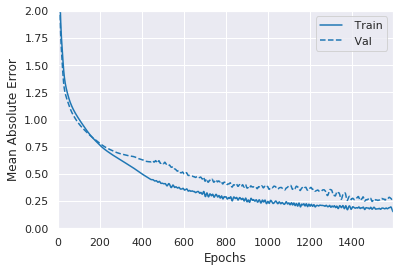

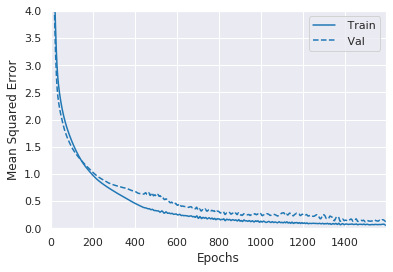

In [50]:
plt.figure()
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({"": history}, metric = "mae")
plt.ylim([0, 2])
plt.ylabel('Mean Absolute Error')

plt.figure()
plotter.plot({"": history}, metric = "mse")
plt.ylim([0, 4])
plt.ylabel('Mean Squared Error')

plt.show()

In [51]:
def inv_scale(y):
    ret_y = np.copy(y)
    ret_y[:, :, 0] = ret_y[:, :, 0] * 33.5
    ret_y[:, :, 1] = ret_y[:, :, 1] * 16.8
    return ret_y

def average_distance_error(preds, y_test, scaled=False):
    if scaled:
        preds = inv_scale(preds)
        y_test = inv_scale(y_test)
    return np.mean(np.sqrt(np.sum(np.square(preds - y_test), axis=2)))

1328/1 - 0s - loss: 0.0620 - mae: 0.2125 - mse: 0.0909
Test loss: 0.0908843664429992
Mean absolute error: 0.21245183
Mean squared error: 0.09088439
Average distance error: 0.34129167714245123


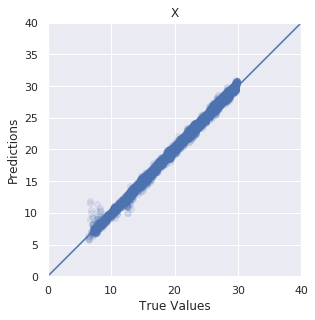

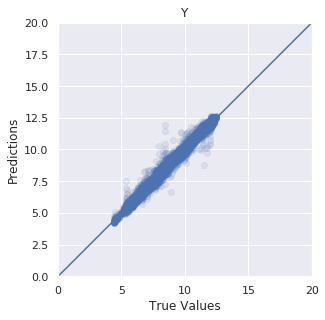

In [52]:
validation_scores = model.evaluate(X_validation, y_validation, verbose=2)
print("Test loss:", validation_scores[0])
print("Mean absolute error:", validation_scores[1])
print("Mean squared error:", validation_scores[2])

preds = model.predict(X_validation)
print("Average distance error:", average_distance_error(preds, y_validation))

fig = plt.figure(figsize=(10, 20))
lims = [0, 40]
ax1 = fig.add_subplot(121, aspect='equal', title='X', xlim=lims, ylim=lims, xlabel='True Values', ylabel='Predictions')
ax1.scatter(y_validation[:, :, 0], preds[:, :, 0], alpha=0.1)
ax1.plot(lims, lims)

fig = plt.figure(figsize=(10, 20))
lims = [0, 20]
ax1 = fig.add_subplot(121, aspect='equal', title='Y', xlim=lims, ylim=lims, xlabel='True Values', ylabel='Predictions')

ax1.scatter(y_validation[:, :, 1], preds[:, :, 1], alpha=0.1)
ax1.plot(lims, lims)

plt.show()

967/1 - 0s - loss: 1.6472 - mae: 0.8014 - mse: 1.2921
Test loss: 1.2920629001822566
Mean absolute error: 0.8014479
Mean squared error: 1.292063
Average distance error: 1.2717101284194263


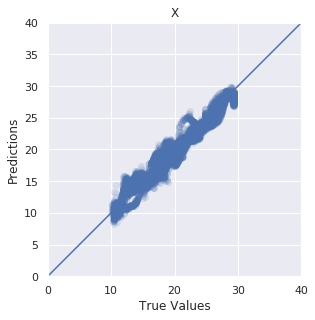

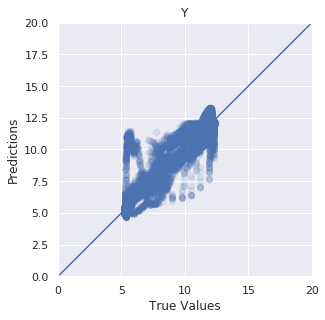

In [53]:
test_scores = model.evaluate(X_test, y_test, verbose=2)
print("Test loss:", test_scores[0])
print("Mean absolute error:", test_scores[1])
print("Mean squared error:", test_scores[2])

preds = model.predict(X_test)
print("Average distance error:", average_distance_error(preds, y_test))

fig = plt.figure(figsize=(10, 20))
lims = [0, 40]
ax1 = fig.add_subplot(121, aspect='equal', title='X', xlim=lims, ylim=lims, xlabel='True Values', ylabel='Predictions')
ax1.scatter(y_test[:, :, 0], preds[:, :, 0], alpha=0.1)
ax1.plot(lims, lims)

fig = plt.figure(figsize=(10, 20))
lims = [0, 20]
ax1 = fig.add_subplot(121, aspect='equal', title='Y', xlim=lims, ylim=lims, xlabel='True Values', ylabel='Predictions')

ax1.scatter(y_test[:, :, 1], preds[:, :, 1], alpha=0.1)
ax1.plot(lims, lims)

plt.show()

In [54]:
def cdf(preds, y_test):
    plt.figure(figsize=(10, 10))

    Z = np.sqrt(np.sum(np.square(preds - y_test), axis=2)).reshape(-1)
    N = Z.size

    X = np.sort(Z)
    F = np.array(range(N)) / float(N)
    plt.plot(X, F)
    plt.title('CDF of Euclidean Distance Error')
    plt.xlabel('Euclidean Distance Error (m)')
    plt.ylabel('Density')
    plt.show()

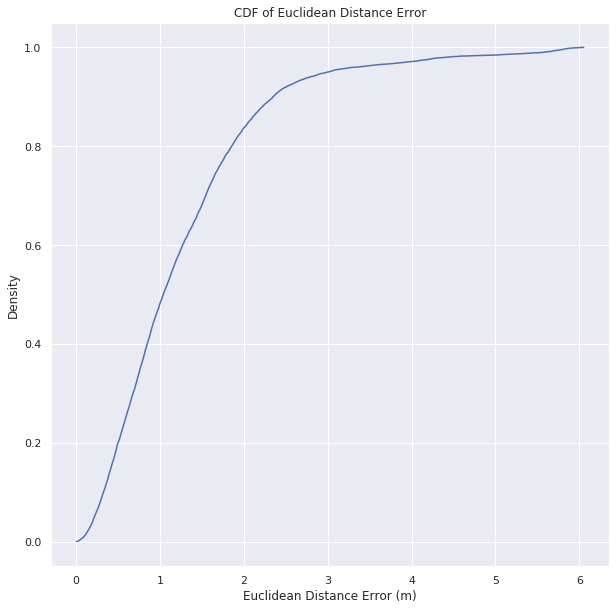

In [55]:
cdf(preds, y_test)

In [56]:
model.save("../Models/LSTM_W10.h5")